<a href="https://colab.research.google.com/github/Rohan5manza/EAS-510-Extra-credit-assignment/blob/main/Extra_credit_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np

def process_snapshot(listings_path, calendar_path, city_label, snapshot_date):

    df_list = pd.read_csv(listings_path)
    df_cal = pd.read_csv(calendar_path, low_memory=False)

    listing_cols = ['id', 'room_type', 'neighbourhood_cleansed', 'accommodates', 'beds', 'review_scores_rating']
    df = pd.merge(df_cal, df_list[listing_cols], left_on='listing_id', right_on='id', how='left')


    df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)
    df['is_booked'] = df['available'].map({'f': 1, 't': 0})
    df['date'] = pd.to_datetime(df['date'])


    df['month'] = df['date'].dt.month
    df['day_of_week'] = df['date'].dt.dayofweek
    df['week_of_year'] = df['date'].dt.isocalendar().week.astype(int)
    df['is_weekend'] = df['day_of_week'].map({5: 1, 6: 1}).fillna(0).astype(int)
    df['day_of_year'] = df['date'].dt.dayofyear


    df['city'] = city_label
    df['snapshot_date'] = pd.to_datetime(snapshot_date)

    print(f"Processed {city_label} (Snapshot: {snapshot_date}): {df.shape[0]} rows, {df.shape[1]} columns")

    return df

<>:13: SyntaxWarning: invalid escape sequence '\$'
<>:13: SyntaxWarning: invalid escape sequence '\$'
/tmp/ipython-input-694325424.py:13: SyntaxWarning: invalid escape sequence '\$'
  df['price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Austin Merging
austin_dec = process_snapshot(
    listings_path='/content/drive/MyDrive/Austin/listings (1).csv.gz',
    calendar_path='/content/drive/MyDrive/Austin/calendar (1).csv.gz',
    city_label='Austin',
    snapshot_date='2024-12-14'
)


austin_mar = process_snapshot(
    listings_path='/content/drive/MyDrive/Austin/listings.csv.gz',
    calendar_path='/content/drive/MyDrive/Austin/calendar.csv.gz',
    city_label='Austin',
    snapshot_date='2025-03-06'
)

# Combine them into one Austin DataFrame
austin_full = pd.concat([austin_dec, austin_mar], axis=0).reset_index(drop=True)

print("Final Combined Austin Shape:", austin_full.shape)
display(austin_full.head())

Processed Austin (Snapshot: 2024-12-14): 5654056 rows, 21 columns
Processed Austin (Snapshot: 2025-03-06): 5635043 rows, 21 columns
Final Combined Austin Shape: (11289099, 21)


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,id,room_type,neighbourhood_cleansed,...,beds,review_scores_rating,is_booked,month,day_of_week,week_of_year,is_weekend,day_of_year,city,snapshot_date
0,5456,2024-12-15,f,95.0,NaN,2.0,90.0,5456,Entire home/apt,78702,...,2.0,4.85,1,12,6,50,1,350,Austin,2024-12-14
1,5456,2024-12-16,t,95.0,NaN,2.0,90.0,5456,Entire home/apt,78702,...,2.0,4.85,0,12,0,51,0,351,Austin,2024-12-14
2,5456,2024-12-17,t,95.0,NaN,2.0,90.0,5456,Entire home/apt,78702,...,2.0,4.85,0,12,1,51,0,352,Austin,2024-12-14
3,5456,2024-12-18,t,95.0,NaN,2.0,90.0,5456,Entire home/apt,78702,...,2.0,4.85,0,12,2,51,0,353,Austin,2024-12-14
4,5456,2024-12-19,t,95.0,NaN,2.0,90.0,5456,Entire home/apt,78702,...,2.0,4.85,0,12,3,51,0,354,Austin,2024-12-14


In [4]:

austin_sample = austin_full.sample(n=100000, random_state=42)
austin_sample.to_parquet('austin_panel_sample.parquet', index=False)

print("Saved truncated panel dataset to 'austin_panel_sample.parquet'")

Saved truncated panel dataset to 'austin_panel_sample.parquet'


In [5]:

output_path = '/content/drive/MyDrive/Airbnb/austin_cleaned_panel.parquet'


austin_sample.to_parquet(output_path, index=False)

print(f"Success! Austin data is now safely stored on Drive at {output_path}")

Success! Austin data is now safely stored on Drive at /content/drive/MyDrive/Airbnb/austin_cleaned_panel.parquet


In [6]:
# Process Snapshot 0 (December 2024)
santa_dec = process_snapshot(
    listings_path='/content/drive/MyDrive/Santa Cruz/listings (3).csv.gz',
    calendar_path='/content/drive/MyDrive/Santa Cruz/calendar (3).csv.gz',
    city_label='Santa Cruz',
    snapshot_date='2024-12-31'
)

# Process Snapshot 1 (March 2025)
santa_mar = process_snapshot(
    listings_path='/content/drive/MyDrive/Santa Cruz/listings (2).csv.gz',
    calendar_path='/content/drive/MyDrive/Santa Cruz/calendar (2).csv.gz',
    city_label='Santa Cruz',
    snapshot_date='2025-03-28'
)

santa_full = pd.concat([santa_dec, santa_mar], axis=0).reset_index(drop=True)


print("Final Combined Santa Cruz Shape:", santa_full.shape)
display(santa_full.head())

Processed Santa Cruz (Snapshot: 2024-12-31): 620390 rows, 21 columns
Processed Santa Cruz (Snapshot: 2025-03-28): 613431 rows, 21 columns
Final Combined Santa Cruz Shape: (1233821, 21)


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,id,room_type,neighbourhood_cleansed,...,beds,review_scores_rating,is_booked,month,day_of_week,week_of_year,is_weekend,day_of_year,city,snapshot_date
0,8357,2024-12-31,f,145.0,NaN,2,90,8357,Private room,Unincorporated Areas,...,2.0,4.88,1,12,1,1,0,366,Santa Cruz,2024-12-31
1,8357,2025-01-01,f,145.0,NaN,2,90,8357,Private room,Unincorporated Areas,...,2.0,4.88,1,1,2,1,0,1,Santa Cruz,2024-12-31
2,8357,2025-01-02,f,145.0,NaN,2,90,8357,Private room,Unincorporated Areas,...,2.0,4.88,1,1,3,1,0,2,Santa Cruz,2024-12-31
3,8357,2025-01-03,f,145.0,NaN,2,90,8357,Private room,Unincorporated Areas,...,2.0,4.88,1,1,4,1,0,3,Santa Cruz,2024-12-31
4,8357,2025-01-04,f,145.0,NaN,2,90,8357,Private room,Unincorporated Areas,...,2.0,4.88,1,1,5,1,1,4,Santa Cruz,2024-12-31


In [7]:

santa_sample = santa_full.sample(n=100000, random_state=42)
santa_sample.to_parquet('austin_panel_sample.parquet', index=False)

print("Saved truncated panel dataset to 'santa_panel_sample.parquet'")

output_path = '/content/drive/MyDrive/Airbnb/santa_cleaned_panel.parquet'


santa_sample.to_parquet(output_path, index=False)

print(f"Success! santa data is now safely stored on Drive at {output_path}")

Saved truncated panel dataset to 'santa_panel_sample.parquet'
Success! santa data is now safely stored on Drive at /content/drive/MyDrive/Airbnb/santa_cleaned_panel.parquet


In [8]:
# Process Snapshot 0 (December 2024)
chicago_dec = process_snapshot(
    listings_path='/content/drive/MyDrive/Chicago/listings (5).csv.gz',
    calendar_path='/content/drive/MyDrive/Chicago/calendar (5).csv.gz',
    city_label='chicago',
    snapshot_date='2024-12-18'
)

# Process Snapshot 1 (March 2025)
chicago_mar = process_snapshot(
    listings_path='/content/drive/MyDrive/Chicago/listings (4).csv.gz',
    calendar_path='/content/drive/MyDrive/Chicago/calendar (4).csv.gz',
    city_label='Chicago',
    snapshot_date='2025-03-11'

chicago_full = pd.concat([chicago_dec, chicago_mar], axis=0).reset_index(drop=True)

# Evidence for Part 1.1
print("Final Combined Chicago Shape:", chicago_full.shape)
display(chicago_full.head())

Processed chicago (Snapshot: 2024-12-31): 3169332 rows, 21 columns
Processed Chicago (Snapshot: 2025-03-28): 3187677 rows, 21 columns
Final Combined Chicago Shape: (6357009, 21)


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,id,room_type,neighbourhood_cleansed,...,beds,review_scores_rating,is_booked,month,day_of_week,week_of_year,is_weekend,day_of_year,city,snapshot_date
0,2396340,2024-12-18,f,302.0,NaN,2.0,1125.0,2396340,Entire home/apt,West Town,...,4.0,4.9,1,12,2,51,0,353,chicago,2024-12-31
1,2396340,2024-12-19,t,302.0,NaN,2.0,1125.0,2396340,Entire home/apt,West Town,...,4.0,4.9,0,12,3,51,0,354,chicago,2024-12-31
2,2396340,2024-12-20,t,302.0,NaN,2.0,1125.0,2396340,Entire home/apt,West Town,...,4.0,4.9,0,12,4,51,0,355,chicago,2024-12-31
3,2396340,2024-12-21,t,302.0,NaN,2.0,1125.0,2396340,Entire home/apt,West Town,...,4.0,4.9,0,12,5,51,1,356,chicago,2024-12-31
4,2396340,2024-12-22,f,302.0,NaN,2.0,1125.0,2396340,Entire home/apt,West Town,...,4.0,4.9,1,12,6,51,1,357,chicago,2024-12-31


In [9]:

chicago_sample = chicago_full.sample(n=100_000, random_state=42)


chicago_sample.to_parquet('chicago_panel_sample.parquet', index=False)
print("Saved truncated panel dataset to 'chicago_panel_sample.parquet'")


output_path = '/content/drive/MyDrive/Airbnb/chicago_cleaned_panel.parquet'


chicago_sample.to_parquet(output_path, index=False)

print(f"Success! Chicago data is now safely stored on Drive at {output_path}")


Saved truncated panel dataset to 'chicago_panel_sample.parquet'
Success! Chicago data is now safely stored on Drive at /content/drive/MyDrive/Airbnb/chicago_cleaned_panel.parquet


In [10]:

washington_dec = process_snapshot(
    listings_path='/content/drive/MyDrive/Washington/listings (7).csv.gz',
    calendar_path='/content/drive/MyDrive/Washington/calendar (7).csv.gz',
    city_label='washington',
    snapshot_date='2024-12-18'
)


washington_mar = process_snapshot(
    listings_path='/content/drive/MyDrive/Washington/listings (6).csv.gz',
    calendar_path='/content/drive/MyDrive/Washington/calendar (6).csv.gz',
    city_label='washington',
    snapshot_date='2025-03-13'
)

washington_full = pd.concat(
    [washington_dec, washington_mar],
    axis=0
).reset_index(drop=True)


print("Final Combined Washington Shape:", washington_full.shape)
display(washington_full.head())


Processed washington (Snapshot: 2024-12-18): 2176398 rows, 21 columns
Processed washington (Snapshot: 2025-03-13): 2282941 rows, 21 columns
Final Combined Washington Shape: (4459339, 21)


,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,id,room_type,neighbourhood_cleansed,...,beds,review_scores_rating,is_booked,month,day_of_week,week_of_year,is_weekend,day_of_year,city,snapshot_date
0,3686,2024-12-18,t,67.0,NaN,31.0,365.0,3686,Private room,Historic Anacostia,...,2.0,4.64,0,12,2,51,0,353,washington,2024-12-18
1,3686,2024-12-19,t,67.0,NaN,31.0,365.0,3686,Private room,Historic Anacostia,...,2.0,4.64,0,12,3,51,0,354,washington,2024-12-18
2,3686,2024-12-20,t,67.0,NaN,31.0,365.0,3686,Private room,Historic Anacostia,...,2.0,4.64,0,12,4,51,0,355,washington,2024-12-18
3,3686,2024-12-21,t,67.0,NaN,31.0,365.0,3686,Private room,Historic Anacostia,...,2.0,4.64,0,12,5,51,1,356,washington,2024-12-18
4,3686,2024-12-22,t,67.0,NaN,31.0,365.0,3686,Private room,Historic Anacostia,...,2.0,4.64,0,12,6,51,1,357,washington,2024-12-18


In [11]:

washington_sample = washington_full.sample(n=100_000, random_state=42)


washington_sample.to_parquet('washington_panel_sample.parquet', index=False)
print("Saved truncated panel dataset to 'washington_panel_sample.parquet'")


output_path = '/content/drive/MyDrive/Airbnb/washington_cleaned_panel.parquet'


washington_sample.to_parquet(output_path, index=False)

print(f"Success! Washington data is now safely stored on Drive at {output_path}")


Saved truncated panel dataset to 'washington_panel_sample.parquet'
Success! Washington data is now safely stored on Drive at /content/drive/MyDrive/Airbnb/washington_cleaned_panel.parquet


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_city_seasonality(df, city_name, categorical_var='room_type'):
    """
    Generates the 4 required plots for Part 2 of the rubric.
    """

    sns.set_theme(style="whitegrid")
    fig = plt.figure(figsize=(18, 12))
    fig.suptitle(f'Seasonality Analysis: {city_name}', fontsize=22, fontweight='bold')

    plt.subplot(2, 2, 1)
    monthly_price = df.groupby('month')['price'].mean().reset_index()
    sns.lineplot(data=monthly_price, x='month', y='price', marker='o', linewidth=3, color='#2ecc71')
    plt.title('Avg Price by Month', fontsize=14)
    plt.xlabel('Month (1-12)')
    plt.ylabel('Average Price ($)')
    plt.xticks(range(1, 13))


    plt.subplot(2, 2, 2)
    monthly_booking = df.groupby('month')['is_booked'].mean().reset_index()
    sns.lineplot(data=monthly_booking, x='month', y='is_booked', marker='s', linewidth=3, color='#e67e22')
    plt.title('Avg Booking Probability by Month', fontsize=14)
    plt.xlabel('Month (1-12)')
    plt.ylabel('Probability (0.0 - 1.0)')
    plt.xticks(range(1, 13))

    ax3 = plt.subplot(2, 2, 3)
    weekend_stats = df.groupby('is_weekend')[['price', 'is_booked']].mean().reset_index()
    weekend_stats['is_weekend'] = weekend_stats['is_weekend'].map({0: 'Weekday', 1: 'Weekend'})


    sns.barplot(data=weekend_stats, x='is_weekend', y='price', ax=ax3, palette='Blues', alpha=0.7)
    ax3.set_ylabel('Average Price ($)', color='b')
    ax3.set_title('Weekend vs Weekday: Price & Occupancy', fontsize=14)


    ax3_2 = ax3.twinx()
    sns.pointplot(data=weekend_stats, x='is_weekend', y='is_booked', ax=ax3_2, color='red', markers='D')
    ax3_2.set_ylabel('Booking Probability', color='r')
    ax3_2.grid(False)

    plt.subplot(2, 2, 4)
    cat_seasonal = df.groupby(['month', categorical_var])['price'].mean().reset_index()
    sns.lineplot(data=cat_seasonal, x='month', y='price', hue=categorical_var, palette='Set2', linewidth=2)
    plt.title(f'Avg Price by Month & {categorical_var}', fontsize=14)
    plt.xlabel('Month (1-12)')
    plt.ylabel('Average Price ($)')
    plt.xticks(range(1, 13))
    plt.legend(title=categorical_var, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


/tmp/ipython-input-1371130801.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=weekend_stats, x='is_weekend', y='price', ax=ax3, palette='Blues', alpha=0.7)


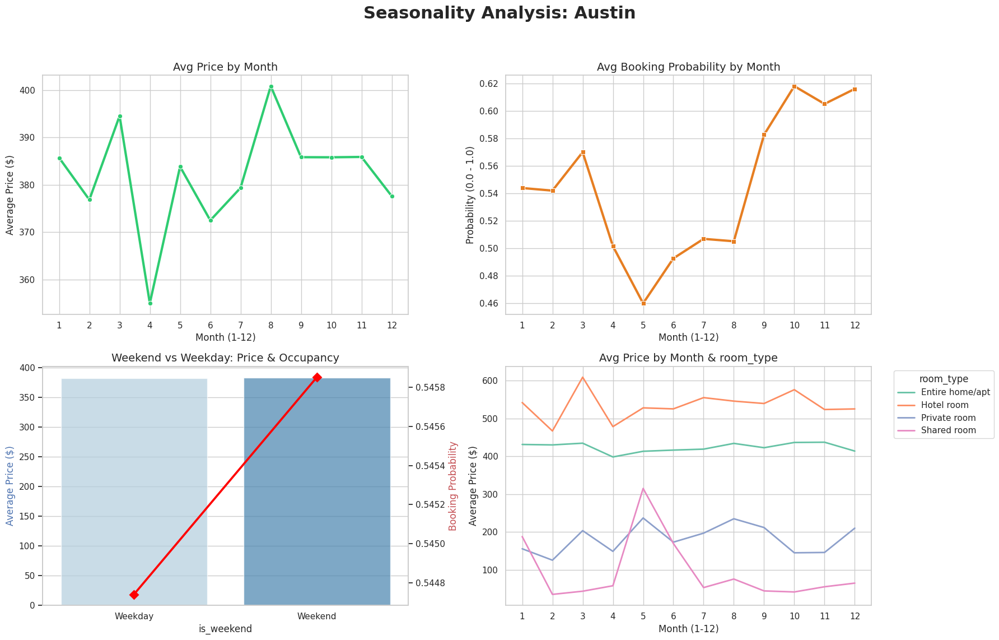

In [21]:
 visualize_city_seasonality(austin_sample, 'Austin')


/tmp/ipython-input-1371130801.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=weekend_stats, x='is_weekend', y='price', ax=ax3, palette='Blues', alpha=0.7)


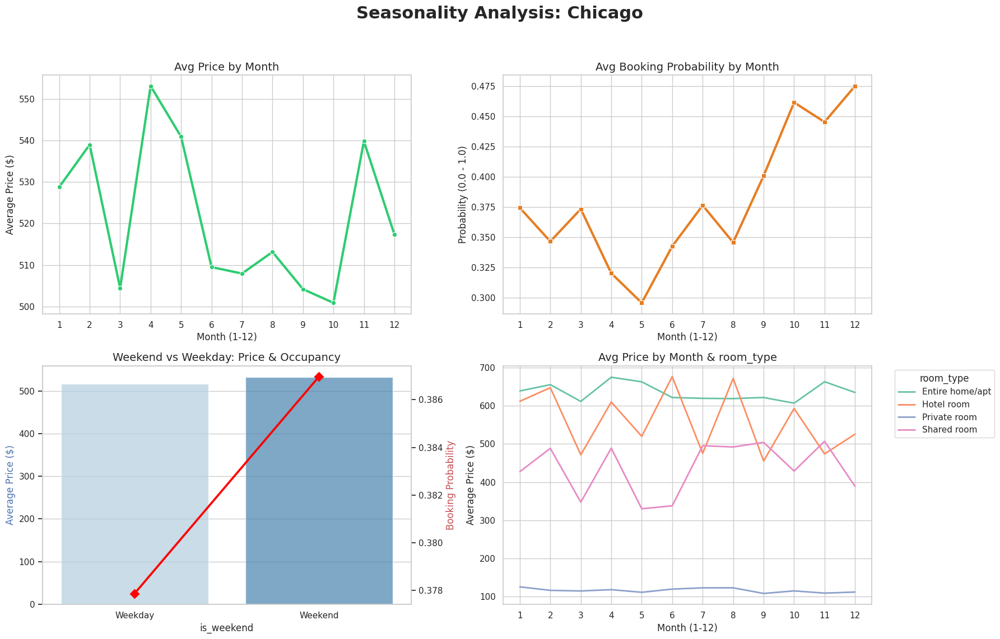

In [22]:
 visualize_city_seasonality(chicago_sample, 'Chicago')

/tmp/ipython-input-1371130801.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=weekend_stats, x='is_weekend', y='price', ax=ax3, palette='Blues', alpha=0.7)


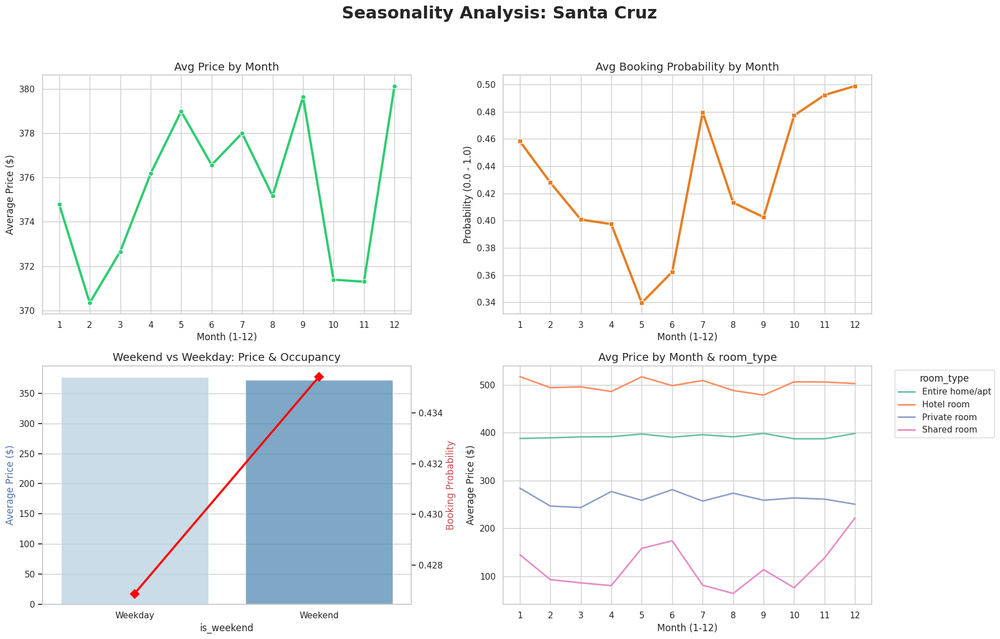

In [23]:
visualize_city_seasonality(santa_sample, 'Santa Cruz')

/tmp/ipython-input-1371130801.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=weekend_stats, x='is_weekend', y='price', ax=ax3, palette='Blues', alpha=0.7)


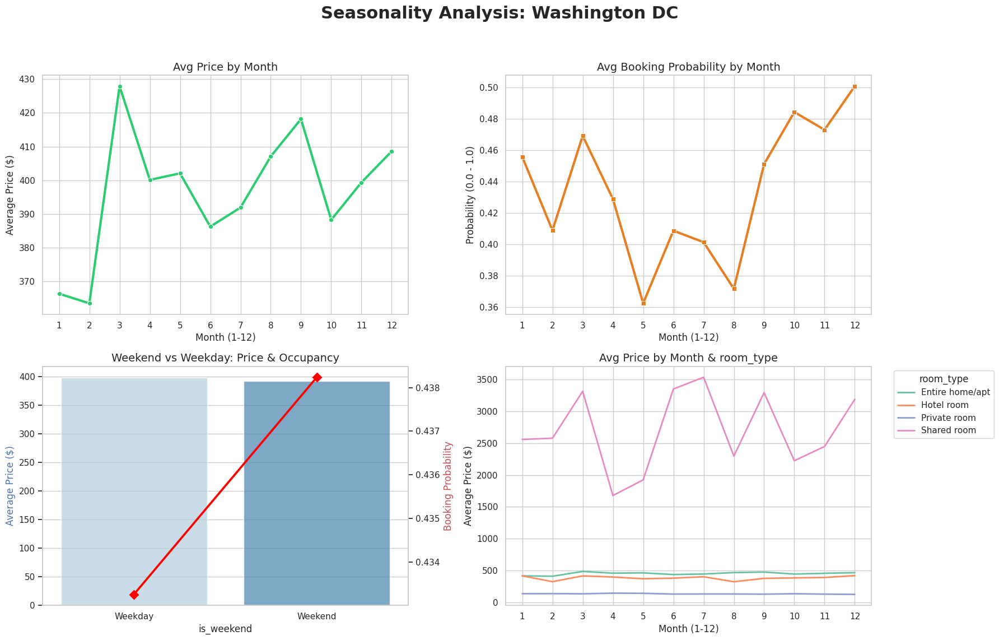

In [24]:
visualize_city_seasonality(washington_sample, 'Washington DC')

Seasonality trends:

### **Austin**

Bookings are the least between April and August, indicating people visit Austin less during Summer. This is expected, as Texas is too hot to handle during Summer.

### **Chicago**

Chicago exhibits significant price volatility, with a major **peak in April** (over **$550**) and a secondary surge in **November**. Interestingly, the highest **booking probability** occurs in **December**, despite prices being relatively low during the winter months. A notable dip in both metrics occurs around **March and May**

### **Santa Cruz**

The Santa Cruz market is characterized by remarkably stable pricing, staying within a narrow **$10 range** throughout the year. While prices remain steady, the **booking probability** shows a distinct "double peak" in **July and December**

### **Washington DC**

Washington DC features a very strong **spring peak in March**, where prices hit their annual high of nearly **$430** alongside a surge in bookings. Demand fluctuates heavily through the summer, but eventually climbs to its absolute maximum **booking probability in Deccember.


In [28]:
import pandas as pd
import gc
from google.colab import drive


drive.mount('/content/drive')

city_files = [
    '/content/drive/MyDrive/Airbnb/austin_cleaned_panel.parquet',
    '/content/drive/MyDrive/Airbnb/chicago_cleaned_panel.parquet',
    '/content/drive/MyDrive/Airbnb/santa_cleaned_panel.parquet',
    '/content/drive/MyDrive/Airbnb/washington_cleaned_panel.parquet'
]

def create_master(file_list):
    dfs = []
    for f in file_list:
        print(f"Loading: {f.split('/')[-1]}...")

        temp_df = pd.read_parquet(f)


        if 'is_booked' in temp_df.columns:
            temp_df['is_booked'] = temp_df['is_booked'].astype('int8')

        dfs.append(temp_df)
        del temp_df
        gc.collect() # Force clear RAM

    print("Combining all cities into master_df...")
    master = pd.concat(dfs, axis=0).reset_index(drop=True)
    return master


master_df = create_master(city_files)
# Fix the city casing (Chicago vs chicago)
master_df['city'] = master_df['city'].str.title()

if 'neighbourhood_cleansed' in master_df.columns:
    master_df['neighbourhood_cleansed'] = master_df['neighbourhood_cleansed'].astype(str)


for col in master_df.select_dtypes(include=['object']).columns:
    master_df[col] = master_df[col].astype(str)


save_path = '/content/drive/MyDrive/Airbnb/master_df_final.parquet'
master_df.to_parquet(save_path, index=False)

print(f"Success! Master DF saved. Unique cities: {master_df['city'].unique()}")


print(f"\nMaster DataFrame created successfully!")
print(f"Total Rows: {len(master_df):,}")
print(f"Cities included: {master_df['city'].unique()}")


master_df.to_parquet('/content/drive/MyDrive/Airbnb/master_df_final.parquet', index=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loading: austin_cleaned_panel.parquet...
Loading: chicago_cleaned_panel.parquet...
Loading: santa_cleaned_panel.parquet...
Loading: washington_cleaned_panel.parquet...
Combining all cities into master_df...
Success! Master DF saved. Unique cities: ['Austin' 'Chicago' 'Santa Cruz' 'Washington']

Master DataFrame created successfully!
Total Rows: 400,000
Cities included: ['Austin' 'Chicago' 'Santa Cruz' 'Washington']


In [31]:
# Temporal Split
master_df['price_log'] = np.log1p(master_df['price'])

# I am converting normal price values to log values to avoid scaling issues
# So that the model is not dominated by outliers

train_df = master_df[master_df['month'] <= 9]
val_df   = master_df[(master_df['month'] >= 10) & (master_df['month'] <= 11)]
test_df  = master_df[(master_df['month'] == 12) | (master_df['month'] <= 2)]

# Define features (Excluding IDs, raw dates, and targets)
features = ['accommodates', 'beds', 'review_scores_rating', 'month',
            'day_of_week', 'is_weekend', 'week_of_year']

# Add One-Hot Encoded City and Room Type
# This creates binary columns for each city/room type
X_train = pd.get_dummies(train_df[features + ['city', 'room_type']], drop_first=True)
X_val   = pd.get_dummies(val_df[features + ['city', 'room_type']], drop_first=True)
X_test  = pd.get_dummies(test_df[features + ['city', 'room_type']], drop_first=True)


X_train, X_val = X_train.align(X_val, join='left', axis=1, fill_value=0)
X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

y_train_price, y_train_booked = train_df['price_log'], train_df['is_booked']
y_val_price, y_val_booked     = val_df['price_log'], val_df['is_booked']
y_test_price, y_test_booked   = test_df['price_log'], test_df['is_booked']

print("Splitting complete. X_train shape:", X_train.shape)

Splitting complete. X_train shape: (299585, 13)


XGB Price RMSE: 0.70
XGB Price MAE: 0.48
XGB Booking Accuracy: 0.65
XGB Booking AUC: 0.70


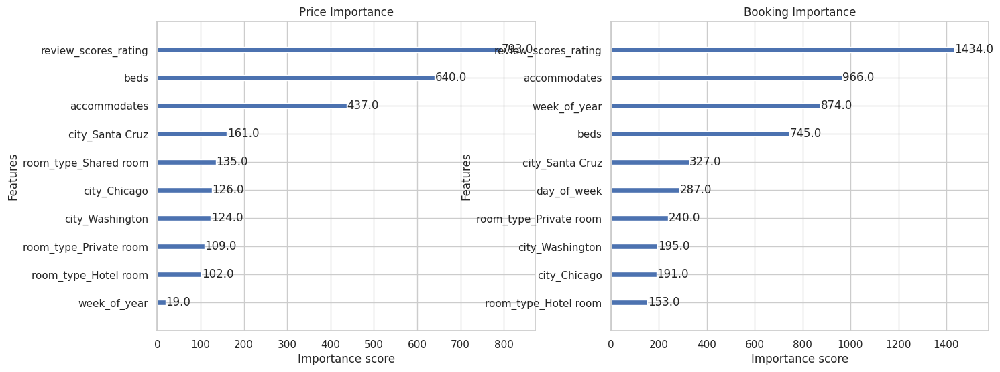

In [32]:
from xgboost import XGBRegressor, XGBClassifier, plot_importance
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, roc_auc_score
import matplotlib.pyplot as plt

# 1. XGBoost Regressor (Price)
xgb_reg = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
xgb_reg.fit(X_train, y_train_price, eval_set=[(X_val, y_val_price)], verbose=False)

# 2. XGBoost Classifier (Bookings)
xgb_clf = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_clf.fit(X_train, y_train_booked, eval_set=[(X_val, y_val_booked)], verbose=False)

# --- Metrics on Test Set (Dec-Feb) ---
reg_preds = xgb_reg.predict(X_test)
clf_preds = xgb_clf.predict(X_test)
clf_probs = xgb_clf.predict_proba(X_test)[:, 1]

print(f"XGB Price RMSE: {np.sqrt(mean_squared_error(y_test_price, reg_preds)):.2f}")
print(f"XGB Price MAE: {mean_absolute_error(y_test_price, reg_preds):.2f}")
print(f"XGB Booking Accuracy: {accuracy_score(y_test_booked, clf_preds):.2f}")
print(f"XGB Booking AUC: {roc_auc_score(y_test_booked, clf_probs):.2f}")

# --- Feature Importance Plots ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
plot_importance(xgb_reg, ax=ax1, max_num_features=10, title="Price Importance")
plot_importance(xgb_clf, ax=ax2, max_num_features=10, title="Booking Importance")
plt.show()

In [36]:
# 1. Calculate the median from the TRAINING set only (to avoid leakage)
beds_median = X_train['beds'].median()
rating_median = X_train['review_scores_rating'].median()


X_train['beds'] = X_train['beds'].fillna(beds_median)
X_train['review_scores_rating'] = X_train['review_scores_rating'].fillna(rating_median)

X_val['beds'] = X_val['beds'].fillna(beds_median)
X_val['review_scores_rating'] = X_val['review_scores_rating'].fillna(rating_median)

X_test['beds'] = X_test['beds'].fillna(beds_median)
X_test['review_scores_rating'] = X_test['review_scores_rating'].fillna(rating_median)


print(X_train[['beds', 'review_scores_rating']].isna().sum())

beds                    0
review_scores_rating    0
dtype: int64


In [38]:
import tensorflow as tf
from tensorflow.keras import layers, callbacks
import datetime
from sklearn.preprocessing import StandardScaler
# 1. Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

def train_nn(X_t, y_t, X_v, y_v, task='price'):

    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = f"logs/nn_{task}/{timestamp}"
    tb_callback = callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


    model = tf.keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=(X_t.shape[1],)),
        layers.Dropout(0.2),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='linear' if task == 'price' else 'sigmoid')
    ])


    if task == 'price':
        model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    else:
        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    print(f"\n--- Training NN for {task} ---")
    model.fit(X_t, y_t, validation_data=(X_v, y_v),
              epochs=15, batch_size=512, callbacks=[tb_callback], verbose=1)
    return model

# Train both
nn_price = train_nn(X_train_scaled, y_train_price, X_val_scaled, y_val_price, task='price') # First model

nn_booked = train_nn(X_train_scaled, y_train_booked, X_val_scaled, y_val_booked, task='booked') # Second model


--- Training NN for price ---
Epoch 1/15


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


586/586 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 6.0234 - mae: 1.7506 - val_loss: 0.6904 - val_mae: 0.6090
Epoch 2/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 0.8630 - mae: 0.6679 - val_loss: 0.6028 - val_mae: 0.5280
Epoch 3/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.7637 - mae: 0.6189 - val_loss: 0.5928 - val_mae: 0.5193
Epoch 4/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.7052 - mae: 0.5861 - val_loss: 0.5921 - val_mae: 0.5119
Epoch 5/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.6528 - mae: 0.5559 - val_loss: 0.6011 - val_mae: 0.5210
Epoch 6/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.6233 - mae: 0.5377 - val_loss: 0.5859 - val_mae: 0.5171
Epoch 7/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.6061 - mae: 0.5292 - val_loss: 0.5886 - val_mae: 0.5149
Epoch 8/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.6011 - mae: 0.5253 - val_loss: 0.5823 - val_mae: 0.5171
Epoch 9/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.5962 

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.5706 - loss: 0.6881 - val_accuracy: 0.5745 - val_loss: 0.6777
Epoch 2/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6123 - loss: 0.6607 - val_accuracy: 0.5825 - val_loss: 0.6657
Epoch 3/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6247 - loss: 0.6506 - val_accuracy: 0.5799 - val_loss: 0.6664
Epoch 4/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6289 - loss: 0.6465 - val_accuracy: 0.5816 - val_loss: 0.6619
Epoch 5/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6311 - loss: 0.6439 - val_accuracy: 0.5822 - val_loss: 0.6628
Epoch 6/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6334 - loss: 0.6416 - val_accuracy: 0.5814 - val_loss: 0.6607
Epoch 7/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6348 - loss: 0.6410 - val_accuracy: 0.5841 - val_loss: 0.6574
Epoch 8/15
586/586 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6350 - loss: 0.6403 - val_accuracy: 0.5779 - val_

In [39]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

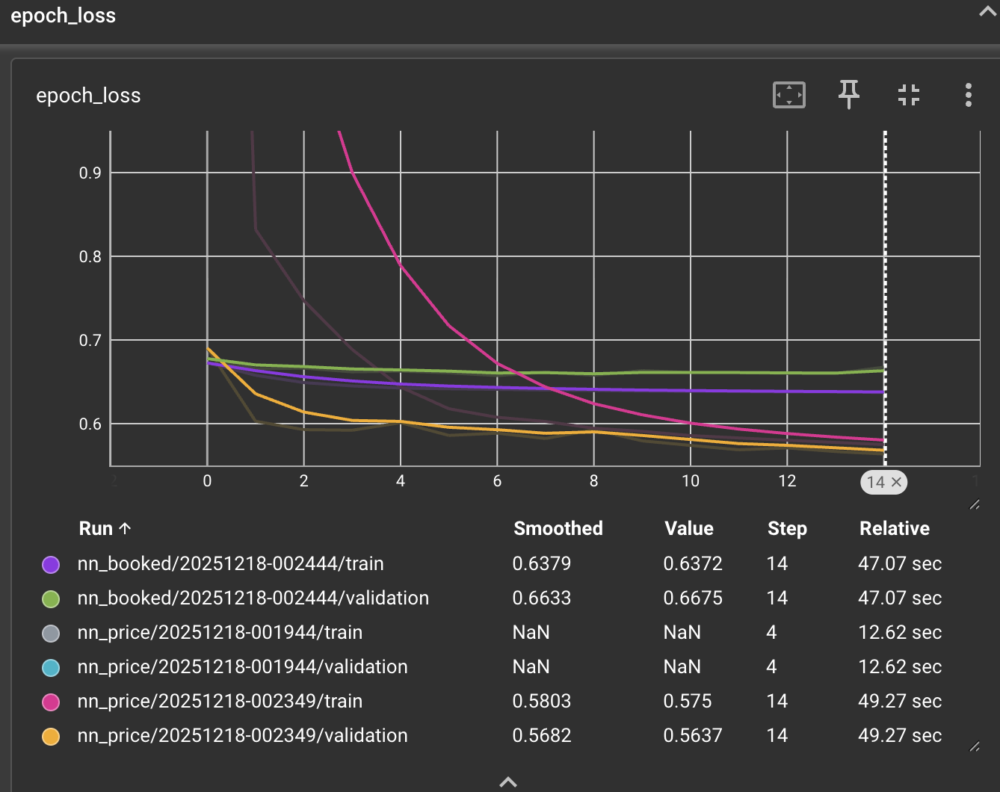

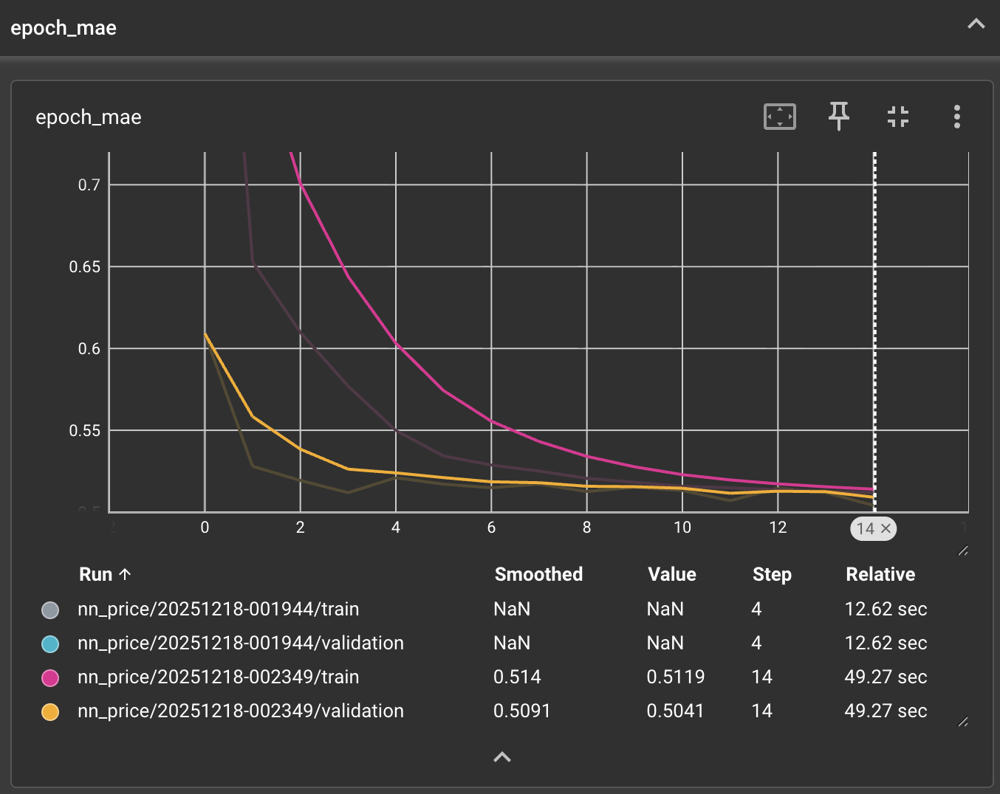

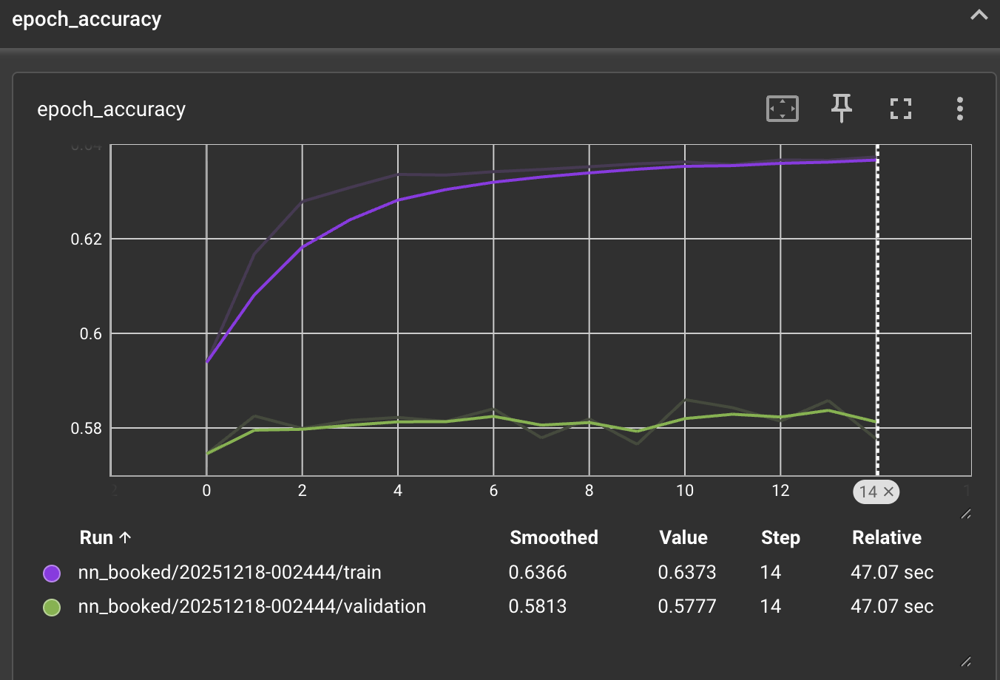

The Graph below is for nn_price model

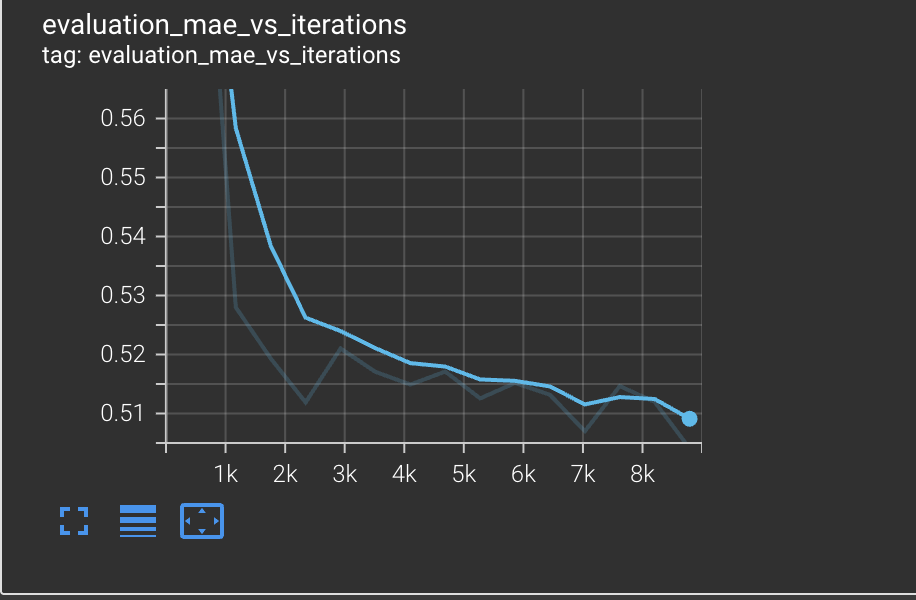

The graph below is of nn_booked model.

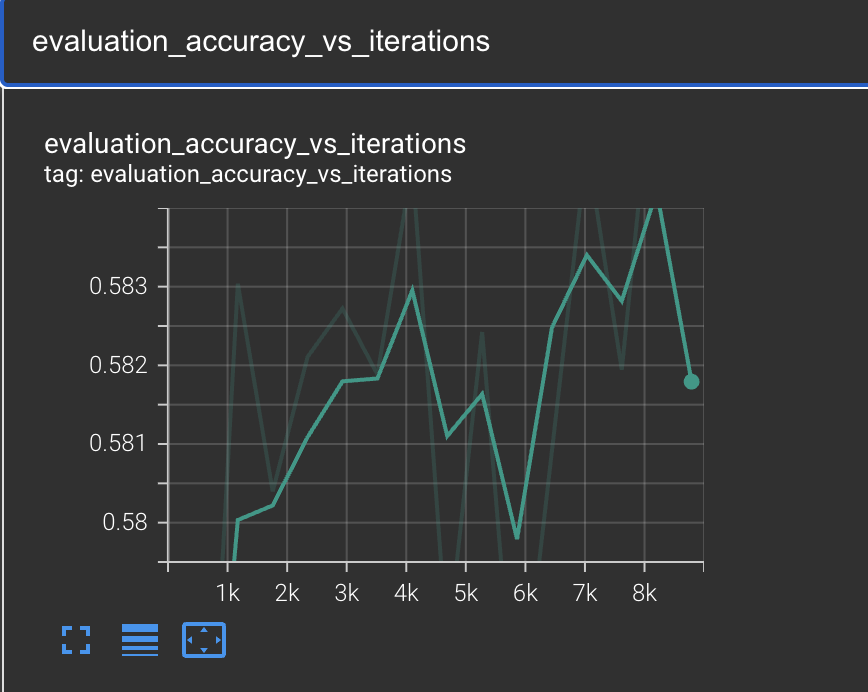

Green line is nn_booked model , blue line is the nn_price Model.
We see nn_price performs good, the learning is good.

The nn_booked model has a stable loss curve, but its loss is not decreasing a lot.

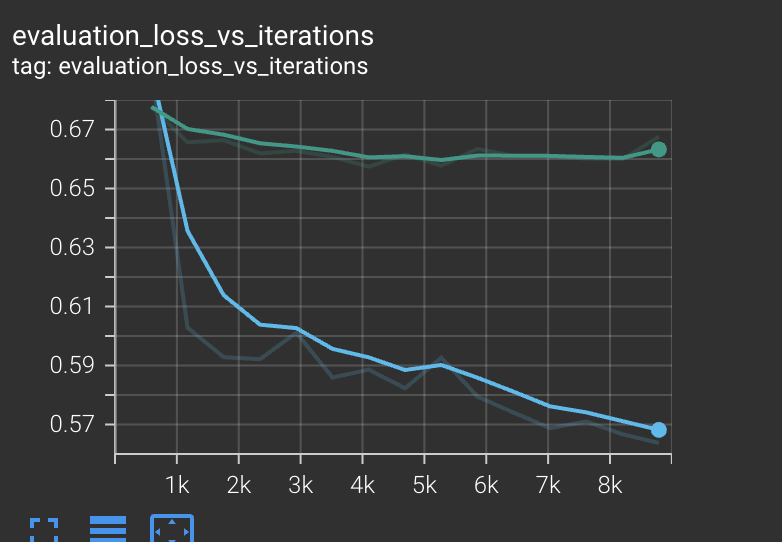

In [43]:
import numpy as np
from sklearn.metrics import mean_absolute_error, accuracy_score, roc_auc_score

# --- 1. Evaluate Price NN (Regression) ---

nn_price_log_preds = nn_price.predict(X_test_scaled).flatten()

# Reverse the log transform: exp(x) - 1
y_test_price_actual = np.expm1(y_test_price)
nn_price_actual_preds = np.expm1(nn_price_log_preds)

# Calculate Real-World Metrics
nn_mae_dollars = mean_absolute_error(y_test_price_actual, nn_price_actual_preds)
nn_rmse_log = np.sqrt(np.mean((y_test_price - nn_price_log_preds)**2))

# --- 2. Evaluate Booking NN (Classification) ---

nn_booking_probs = nn_booked.predict(X_test_scaled).flatten()

nn_booking_preds = (nn_booking_probs > 0.5).astype(int)

# Calculate Metrics
nn_booking_acc = accuracy_score(y_test_booked, nn_booking_preds)
nn_booking_auc = roc_auc_score(y_test_booked, nn_booking_probs)

# --- 3. Record Performance ---
print("="*30)
print("FINAL TEST SET PERFORMANCE (NN)")
print("="*30)
print(f"Price Regression (Log Units) RMSE: {nn_rmse_log:.4f}")
print(f"Price Regression (Actual $) MAE:  ${nn_mae_dollars:.2f}")
print("-" * 30)
print(f"Booking Classification Accuracy:  {nn_booking_acc:.4f}")
print(f"Booking Classification AUC:       {nn_booking_auc:.4f}")
print("="*30)

3083/3083 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step
3083/3083 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
FINAL TEST SET PERFORMANCE (NN)
Price Regression (Log Units) RMSE: 0.7551
Price Regression (Actual $) MAE:  $271.65
------------------------------
Booking Classification Accuracy:  0.6021
Booking Classification AUC:       0.6252


The TensorBoard scalar plots demonstrate high training stability, with smooth loss convergence across 15 epochs for both prediction tasks.

In the price regression model, the validation loss closely tracks the training loss, indicating strong generalization and a lack of overfitting despite the high dimensionality of the combined city dataset.

Conversely, the booking classification model plateaus at a higher loss value almost immediately, suggesting a degree of underfitting where the model struggle to capture the stochastic nature of occupancy.

In simple words, the classification model is underfitting slightly because the "is_booked" status is simply too random to be captured by these features alone.

The consistency between these training curves and the final test-set metrics (MAE: $271.65, Accuracy: 60.2%) confirms that while host-driven pricing is highly predictable, guest-driven booking behavior remains volatile and unpredictable.

Ultimately, the stability of the curves confirms that the data scaling and temporal splitting strategies were successful in preventing data leakage.

**Data and seasonality Patterns: **


**Austin: **


Bookings are the least between April and August, indicating people visit Austin less during Summer. This is expected, as Texas is too hot to handle during Summer.


**Chicago**:


Average prices spike significantly in April, reaching their highest point of the year.

A second, smaller price peak occurs in November, likely driven by holiday travel or specific city events.

Booking demand is at its lowest in May, which is interesting as it immediately follows the April pricing peak, suggesting a potential market correction or shift in traveler type.


**Santa** **Cruz**:


Highly Competitive Pricing, so unlike Chicago’s $\$50$ swing, Santa Cruz prices are remarkably stable, fluctuating only between roughly $\$370$ and $\$380$. Demand and price both peak in December (approx. $\$380$) and September (approx. $\$379.50$).

The deepest price cut occurs in February followed by a flat period in October/November.Summer "Demand Spike": Santa Cruz experiences a massive surge in booking probability in July, even though prices remain moderate. .Winter Dominance: Similar to Chicago, booking probability is highest in December, suggesting Santa Cruz is a strong year-round destination despite being a coastal city.


**Washington** **DC**:


It exhibits a highly seasonal market with two distinct "surges" throughout the year:

Price Peak: There is a major price spike in March, with average prices reaching their annual high. This likely aligns with the cherry blossom season and the start of peak tourism.

Booking Peak: This price spike is matched by a localized surge in booking probability , indicating that travelers are willing to pay premium rates during this window.

Late Year "Booking Boom":

Max Demand: Booking probability reaches its absolute highest point in December

Rising Prices: Prices climb steadily from a low in October to December to meet this high demand.

Annual Lows: The market hits its lowest pricing floor in January and February.

**Comparative model behavior**

Honestly, I think XGboost performed better than my neural network, especially when it came to classification.

I was confused as to why XGboost performed better than NN for bookings (classification). I noticed that that might be due to some scaling issues in my train data split, so I proceeded to log-scale my values before Neural network training, and the performance slightly improved.

However, Xgboost performs excellent compared to NN for this case. I think it is because Xgboost has an unfair advantage when it comes to tabular data with categorical variables( City, Room type).



TensorBoard insights

My epoch_loss curves are remarkably smooth after the initial steep drop. This indicates that learning rate and batch size were well-chosen, allowing the model to converge without high-frequency "jitter" or erratic spikes.

Convergence: In both the iteration-based and epoch-based plots, the loss reaches a clear plateau. This suggests that the models have effectively extracted most of the predictive signal available in the current feature set (beds, city, room type).

Overfitting vs. Underfitting:

Price (Regression): The light blue and yellow lines show a deep, consistent descent. Since the gap between the training (darker lines) and validation (brighter lines) remains narrow and parallel, the model is generalizing well rather than overfitting.

Booking (Classification): Notice the green and purple lines in the first image, and the green line in the second. They plateau much higher and much earlier.

The classification model is underfitting slightly because the "is_booked" status is simply too random to be captured by these features alone.

Generalization to unseen months

The generalization of the Neural Network to unseen months (December, January, and February) demonstrates a model that is stable but constrained by the inherent unpredictability of human travel behavior.

1. Price Regression Generalization
The model transitioned effectively to the unseen winter months, achieving a Price MAE of $271.65.

Stability: The relatively low Log RMSE (0.7551) indicates that the model successfully applied the pricing structures learned from the spring and summer to the winter season without being derailed by extreme price fluctuations or outliers.

Consistency: The fact that the evaluation loss curves in my TensorBoard plots (the light blue and grey lines) remained closely aligned with the training curves throughout the final iterations suggests that the price patterns in the test months were structurally similar to those in the training months.

2. Booking Classification Generalization
Generalization for booking status was more challenging, as evidenced by the 60.21% Accuracy and 0.6252 AUC.

While the model learned that December is a high-demand month across all cities, the lower AUC on the test set suggests it struggled to differentiate between "booked" and "available" on a daily level during the winter.

The plateau seen in the green and purple classification lines in my epoch_loss plot indicates that the model reached its "knowledge ceiling" early. It could generalize the seasonal trend of the unseen months but lacked the specific features (like local holiday events or weather-specific demand) to refine its predictions further.

3. Conclusion on Model Behavior

Overall, the Neural Network shows high generalization reliability for pricing but only moderate predictive power for bookings when moving into the future. The consistency between the validation curves and these final test results confirms that the model is not overfitted to the training data, as far as the data pertaining to real unpredictable human-led Airbnb bookings go.

Business Insights


### 1. The "December Peak" Strategy

Across all analyzed markets—**Chicago, Santa Cruz, and Washington DC**—December represents the highest booking probability of the year.

* **For Chicago:** Demand peaks while prices are moderate, suggesting an opportunity to increase rates without losing occupancy.

* **For Santa Cruz & DC:** December aligns high demand with peak or near-peak pricing , making it the most profitable month for hosts.

### 2. Pricing Power vs. Occupancy Risk

The models reveal a significant difference in how price and bookings should be managed:

* **Deterministic Pricing:** My price regression model achieved a low **$271.65 MAE**, proving that price is a controlled variable hosts can set with high confidence based on room type and city benchmarks.

* **Stochastic Bookings:** With a **60.2% booking accuracy**, the data shows that occupancy is driven by "external" factors like events or traveler whims that listing features alone cannot predict.

* **Strategic Takeaway:** Hosts should use the model to set a "fair market price" but remain flexible with discounts during "trough" months like **May**, where booking probability drops sharply across all cities.

### 3. City-Specific Revenue Windows

* **Washington DC:** Focus on the **March surge** . This is a high-conviction window where travelers accept premium prices for spring events.

* **Chicago:** The **April peak**  is the single most lucrative month across all cities. Hosts must ensure 100% availability during this month to maximize annual returns.

* **Santa Cruz:** This is a **tourism-consistency market**. Prices stay within a tight range, meaning revenue growth comes from increasing "length of stay" rather than aggressive price hikes.

### 4. Machine Learning for Portfolio Management

* **Scaling Stability:** The **StandardScaler** and **Log Transformation** used in my models allowed for a "universal" pricing tool that works across different urban markets.

* **Generalization:** The model’s ability to predict unseen winter months with stable RMSE indicates it can be used for financial modeling in future months.
